# Arrival Time

Extracts the arrival time of the burst as a function of frequency. This is done by fitting gaussians to frequency slices and finding the left and right edges.

In [1]:
from __future__ import division
import math
import os
import sys
import time
import numpy as np
import scipy.stats
from scipy.optimize import curve_fit
from math import log10
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import pi as nombrepi
from scipy import signal, ndimage
from tqdm import tqdm
from matplotlib import colors as mcolors
import functools
print = functools.partial(print, flush=True) # print doesn't happen til script ends so force it to flush... windows thing?
import pandas as pd

bursts = pd.read_csv('bursts.csv')
bursts.head(16)

,filename,name,edge,angle,peak,sigmax,sigmay,Slope,drift (mhz/ms),drift error (mhz/ms),center,center_f,time_res,freq_res,char_tau_0
0,01_puppi_57747_C0531+33_0558_5.dm559.72.calibP...,M1,1525,1.720000,10429.0,173.731526,47.364587,-6.652439,-1039.308995,0.617101,228.755888,4458.212325,0.00001,1.5625,0.000438
1,02_puppi_57747_C0531+33_0558_1183.dm559.72.cal...,M2,1850,1.780000,5692.0,177.080918,44.911875,-4.736866,-739.419463,1.279131,209.060564,4427.438381,0.00001,1.5625,0.000438
2,03_puppi_57747_C0531+33_0558_1202.dm559.72.cal...,M3,1975,1.620000,5668.0,169.749001,19.463885,-19.669528,-2813.966383,5.239849,249.051665,4489.924477,0.00001,1.5625,0.000438
3,04_puppi_57747_C0531+33_0558_25437.dm559.72.ca...,M4,1450,1.710000,5038.0,160.360329,26.706231,-7.137257,-1109.319273,40.321594,322.029396,4603.952181,0.00001,1.5625,0.000438
4,05_puppi_57747_C0531+33_0558_3683.dm559.72.cal...,M5,1450,1.639204,5031.0,37.747383,166.280492,-14.595503,-2109.819670,124.715830,214.396765,4435.776195,0.00001,1.5625,0.000438
5,06_puppi_57747_C0531+33_0558_3687.dm559.72.cal...,M6,1150,1.590000,5569.0,156.557708,12.416683,-52.066970,-6317.730503,30.736619,263.938012,4513.184394,0.00001,1.5625,0.000438
6,07_puppi_57747_C0531+33_0558_3688.dm559.72.cal...,M7,1590,1.720000,5821.0,102.259272,38.969184,-6.652439,-1028.172298,2.175251,160.167242,4351.042566,0.00001,1.5625,0.000438
7,08_puppi_57747_C0531+33_0558_3689.dm559.72.cal...,M8,2000,1.990000,5666.0,171.395398,64.792725,-2.244076,-340.010864,0.162096,296.067560,4563.386812,0.00001,1.5625,0.000438
8,09_puppi_57747_C0531+33_0558_3690.dm559.72.cal...,M9,1600,2.240000,5041.0,133.024941,89.628038,-1.264288,-191.824534,9.704662,216.215087,4438.617323,0.00001,1.5625,0.000438
9,10_puppi_57747_C0531+33_0558_12568.dm559.72.ca...,M10,800,1.750000,5132.0,130.605616,47.074113,-5.470689,-846.471217,34.730967,310.581676,4586.065119,0.00001,1.5625,0.000438


In [2]:
burst = bursts.iloc[15] # michili 16
burstnum = burst[0][:2].strip('0') if burst[0][:2][0] == '0' else burst[0][:2]
print('Burst #{}'.format(burstnum))

folder = 'data'
filename = burst.filename
edge = burst.edge

junk, nchan, nbin, I, Q, U, V = np.loadtxt('{}/{}'.format(folder, filename), delimiter=' ', unpack=True)
Q, U, V = None, None, None
n = len(junk)
print("Data loaded")

binmax = int(nbin[n-1])+1
frequencymax = (int(nchan[n-1])+1)
intensity = np.zeros((frequencymax, binmax))

X = np.zeros(binmax)
Y = np.zeros(frequencymax)

# what are these?
tmin = 500 
tmax = 1500

#### 1. remove noise
intensitynoise1 = np.zeros(tmin-1)
intensitynoise2 = np.zeros(binmax-tmax)
for i in tqdm(range(frequencymax-50,51,-1), desc='noise removal', disable=False):

    Y[i-1] = 4.15 + (i-1) * 1.5625 # ?

    for j in range(1,tmin) :

        intensitynoise1[j-1] = (I[j-1 + binmax*(frequencymax-i)])/(tmin-1)


    for j in range(tmax+1,binmax+1) :

        intensitynoise2[j-1-tmax] = (I[j-1 + binmax*(frequencymax-i)])/(binmax-tmax)

    a = sum(intensitynoise1)
    b = sum(intensitynoise2)

    for j in range(1,binmax+1) :
        X[j-1] = j-1
        intensity[i-1,j-1] = I[j-1 + binmax*(frequencymax-i)] - (a+b)/2

Burst #16
Data loaded


noise removal: 100%|██████████| 411/411 [00:05<00:00, 79.00it/s]


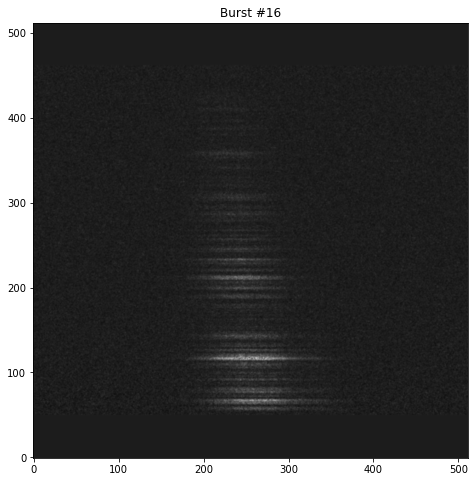

In [3]:
burstwindow = intensity[:,edge:edge+frequencymax]
plt.figure(figsize=(10,8))
plt.title('Burst #{}'.format(burstnum))
plt.imshow(burstwindow, origin='lower', interpolation='bicubic', cmap='gray')

[a, xo, sigma] for row 51: [1.01460028e-01 2.56316053e+02 4.42083567e+01]
[a, xo, sigma] for row 52: [6.00903753e-02 2.54936618e+02 4.31370725e+01]
[a, xo, sigma] for row 53: [   4.72846744 2138.25730762  483.11087946]
[a, xo, sigma] for row 54: [ 1.99865562e-01  2.39884106e+02 -7.91369058e+00]
[a, xo, sigma] for row 55: [2.55460772e-01 2.76663323e+02 1.28587042e+01]
[a, xo, sigma] for row 56: [  0.50373341 264.80065126  40.3212988 ]
[a, xo, sigma] for row 57: [  0.888708   266.41606683  34.43827113]
[a, xo, sigma] for row 58: [  1.11580641 261.47465265  33.87531201]
[a, xo, sigma] for row 59: [  0.76534688 264.23641766  38.07411733]
[a, xo, sigma] for row 60: [  0.50163116 260.7042121   30.70832978]
[a, xo, sigma] for row 61: [1.54004697e-01 2.42212005e+02 1.78536964e+01]
[a, xo, sigma] for row 62: [1.10982185e-01 2.47532416e+02 3.32759631e+01]
[a, xo, sigma] for row 63: [  0.82472606 265.63957939  36.13974524]
[a, xo, sigma] for row 64: [  1.32242713 261.86380159  34.63760808]
[a, xo

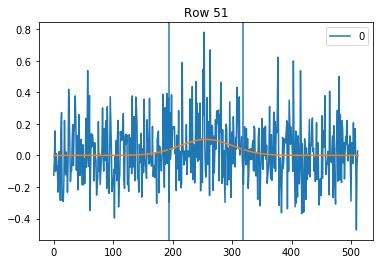

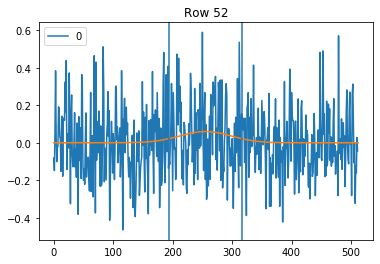

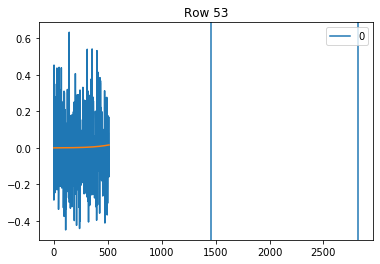

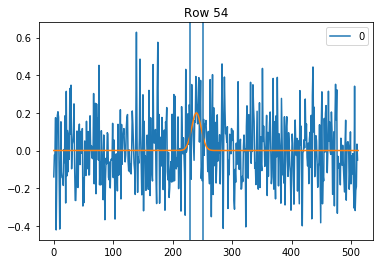

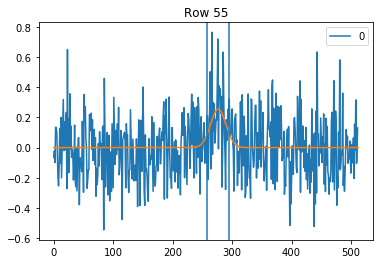

...

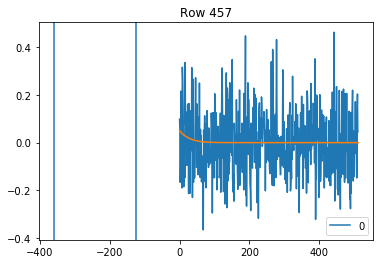

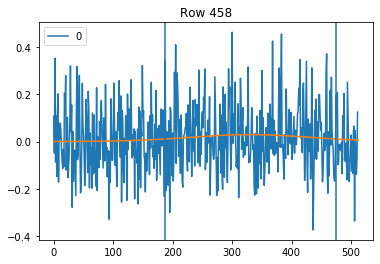

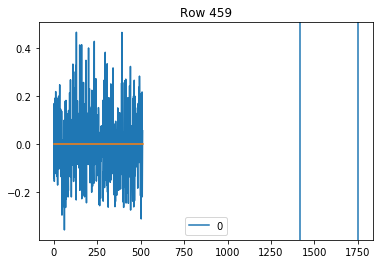

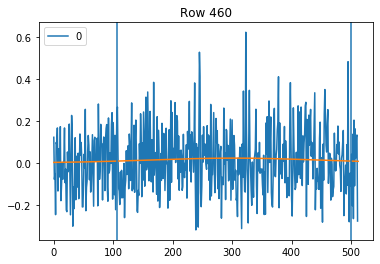

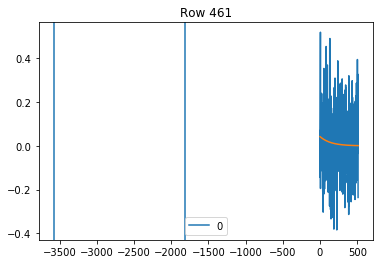

In [44]:
def gaussian(x, a, xo, sigma) :
	return a*np.exp(-(x-xo)**2/(2*(sigma**2)))

def fitgaussian(data):
    # use curve-fit (non-linear leastsq)
    x = data.keys()
    xo = sum(x*data)/sum(data)
    sigma = np.sqrt(abs(sum(data*(x-xo)**2)/sum(data)))
    guess = [np.max(data), xo, sigma]
    popt, pcov = scipy.optimize.curve_fit(gaussian, x, data, p0=guess)
    return popt, pcov

skipped = []
for i, row in enumerate(burstwindow):
    d = pd.DataFrame(burstwindow[i])

    if sum(d[0]) <= 0:
        skipped.append(i)
        continue
    
    d.plot()
    plt.title('Row {}'.format(i))
    try:
        
        popt, pcov = fitgaussian(d[0])
        peakintensity = max(d[0])
        print('[a, xo, sigma, peakintensity] for row {}:'.format(i), popt, peakintensity) # A, c, s
        x = np.linspace(d[0].keys().start, d[0].keys().stop, num=1000)
        # popt = [100, 220, 100]
        t_start = popt[1]-np.sqrt(2)*popt[2]
        t_end   = popt[1]+np.sqrt(2)*popt[2]
        
        plt.plot(x, gaussian(x, *popt))
        plt.axvline(x=t_start)
        plt.axvline(x=t_end)
        
    except RuntimeError:
        print('No parameters found for row', i)


Burst #1
Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 94.04it/s]

Burst #2


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 92.89it/s]

Burst #3


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 95.99it/s]

Burst #4


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 95.58it/s]

Burst #5


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 94.51it/s]

Burst #6


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 93.69it/s]

Burst #7


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 95.17it/s]

Burst #8


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 96.03it/s]

Burst #9


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 93.48it/s]

Burst #10


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 95.91it/s]

Burst #11


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 92.35it/s]

Burst #12


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 94.68it/s]

Burst #13


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 94.93it/s]

Burst #14


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 93.88it/s]

Burst #15


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 93.79it/s]

Burst #16


Data loaded


noise removal: 100%|██████████| 411/411 [00:04<00:00, 93.81it/s]


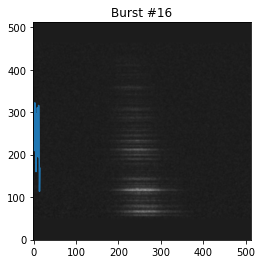

In [12]:
def findarrival(burst):
    burstnum = burst[0][:2].strip('0') if burst[0][:2][0] == '0' else burst[0][:2]
    print('Burst #{}'.format(burstnum))

    folder = 'data'
    filename = burst.filename
    edge = burst.edge

    junk, nchan, nbin, I, Q, U, V = np.loadtxt('{}/{}'.format(folder, filename), delimiter=' ', unpack=True)
    Q, U, V = None, None, None
    n = len(junk)
    print("Data loaded")

    binmax = int(nbin[n-1])+1
    frequencymax = (int(nchan[n-1])+1)
    intensity = np.zeros((frequencymax, binmax))

    X = np.zeros(binmax)
    Y = np.zeros(frequencymax)

    # what are these?
    tmin = 500 
    tmax = 1500

    #### 1. remove noise
    intensitynoise1 = np.zeros(tmin-1)
    intensitynoise2 = np.zeros(binmax-tmax)
    for i in tqdm(range(frequencymax-50,51,-1), desc='noise removal', disable=False):

        Y[i-1] = 4.15 + (i-1) * 1.5625 # ?

        for j in range(1,tmin) :

            intensitynoise1[j-1] = (I[j-1 + binmax*(frequencymax-i)])/(tmin-1)


        for j in range(tmax+1,binmax+1) :

            intensitynoise2[j-1-tmax] = (I[j-1 + binmax*(frequencymax-i)])/(binmax-tmax)

        a = sum(intensitynoise1)
        b = sum(intensitynoise2)

        for j in range(1,binmax+1) :
            X[j-1] = j-1
            intensity[i-1,j-1] = I[j-1 + binmax*(frequencymax-i)] - (a+b)/2

    burstwindow = intensity[:,edge:edge+frequencymax]
    plt.title('Burst #{}'.format(burstnum))
    freqspectrum = pd.DataFrame(burstwindow[:,:].sum(axis=1)[:, None])
    data = freqspectrum[50:463][0]
    x = data.keys()
    xo = sum(x*data)/sum(data)
    return xo # return the central frequency 

burst = bursts.iloc[15] # michili 16

# bursts['center'] = bursts.head(16).apply(findarrival, axis=1)


In [21]:
bursts.iloc[15]

filename                16_puppi_57772_C0531+33_0007_2695.dm559.72.cal...
name                                                                  M16
edge                                                                  700
angle                                                                1.71
peak                                                                12309
sigmax                                                            124.669
sigmay                                                            46.7782
Slope                                                            -7.13726
drift (mhz/ms)                                                   -1129.83
drift error (mhz/ms)                                              1.64189
center                                                             167.93
center_f                                                          4363.17
time_res                                                        1.024e-05
freq_res                              